In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="ticks")
%matplotlib inline

In [3]:
df = pd.read_csv('../data/placement_processed.csv')

In [4]:
df.head()

,gender,ssc_p,ssc_b,hsc_p,hsc_b,hsc_s,degree_p,degree_t,workex,etest_p,specialisation,mba_p,placed,salary
0,M,67.00,Others,91.00,Others,Commerce,58.00,Sci&Tech,0,55.0,Mkt&HR,58.80,1,270000.0
1,M,79.33,Central,78.33,Others,Science,77.48,Sci&Tech,1,86.5,Mkt&Fin,66.28,1,200000.0
2,M,65.00,Central,68.00,Central,Arts,64.00,Comm&Mgmt,0,75.0,Mkt&Fin,57.80,1,250000.0
3,M,56.00,Central,52.00,Central,Science,52.00,Sci&Tech,0,66.0,Mkt&HR,59.43,0,NaN
4,M,85.80,Central,73.60,Central,Commerce,73.30,Comm&Mgmt,0,96.8,Mkt&Fin,55.50,1,425000.0


In [54]:
df.shape

(215, 14)

In [61]:
df.describe()

,ssc_p,hsc_p,degree_p,workex,etest_p,mba_p,placed,salary
count,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,148.000000
mean,67.303395,66.333163,66.370186,0.344186,72.100558,62.278186,0.688372,288655.405405
std,10.827205,10.897509,7.358743,0.476211,13.275956,5.833385,0.464240,93457.452420
min,40.890000,37.000000,50.000000,0.000000,50.000000,51.210000,0.000000,200000.000000
25%,60.600000,60.900000,61.000000,0.000000,60.000000,57.945000,0.000000,240000.000000
50%,67.000000,65.000000,66.000000,0.000000,71.000000,62.000000,1.000000,265000.000000
75%,75.700000,73.000000,72.000000,1.000000,83.500000,66.255000,1.000000,300000.000000
max,89.400000,97.700000,91.000000,1.000000,98.000000,77.890000,1.000000,940000.000000


In [59]:
df.duplicated().sum()

0

In [75]:
df['gender'].value_counts()

M    139
F     76
Name: gender, dtype: int64

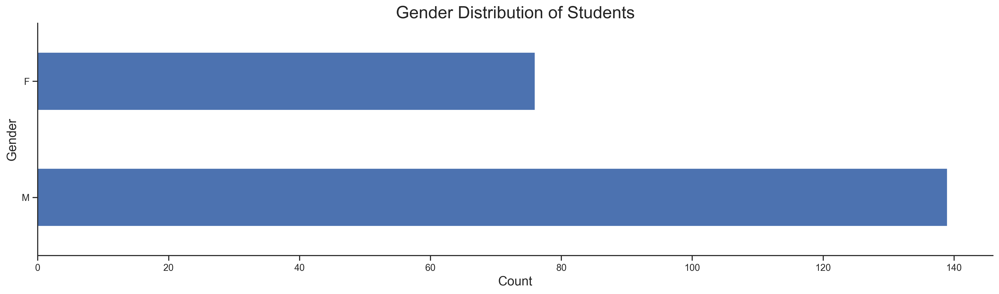

In [5]:
plt.figure(figsize=(20, 5), dpi=300)

df['gender'].value_counts().plot(kind='barh')
plt.title('Gender Distribution of Students', fontsize = 20)
plt.xlabel('Count', fontsize = 15)
plt.ylabel('Gender', fontsize = 15)
sns.despine(top=True);

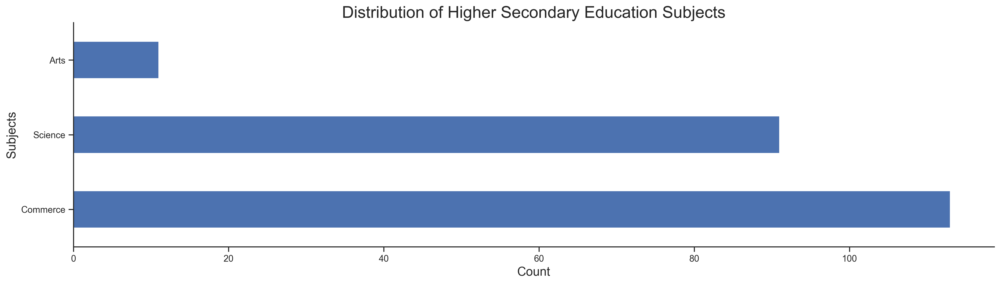

In [9]:
plt.figure(figsize=(20, 5), dpi=300)

df['hsc_s'].value_counts().plot(kind='barh')
plt.title('Distribution of Higher Secondary Education Subjects', fontsize = 20)
plt.xlabel('Count', fontsize = 15)
plt.ylabel('Subjects', fontsize = 15)
sns.despine(top=True);

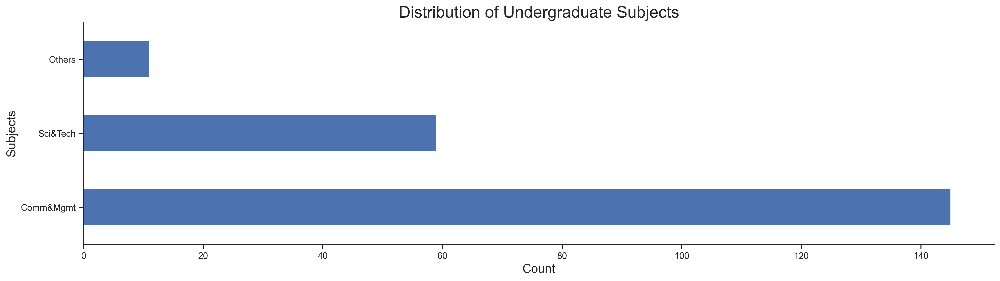

In [10]:
plt.figure(figsize=(20, 5), dpi=300)

df['degree_t'].value_counts().plot(kind='barh')
plt.title('Distribution of Undergraduate Subjects', fontsize = 20)
plt.xlabel('Count', fontsize = 15)
plt.ylabel('Subjects', fontsize = 15)
sns.despine(top=True);

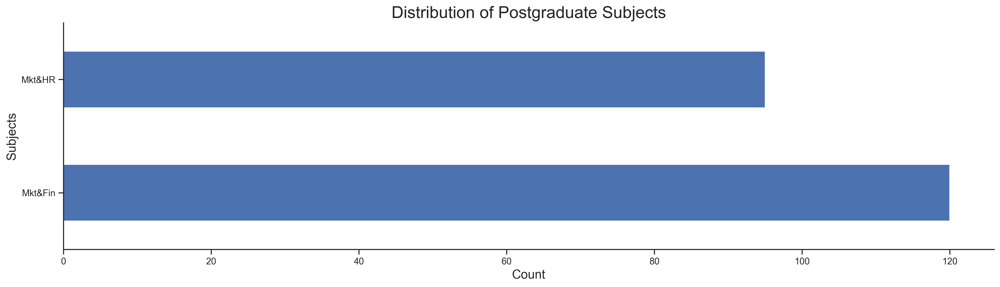

In [11]:
plt.figure(figsize=(20, 5), dpi=300)

df['specialisation'].value_counts().plot(kind='barh')
plt.title('Distribution of Postgraduate Subjects', fontsize = 20)
plt.xlabel('Count', fontsize = 15)
plt.ylabel('Subjects', fontsize = 15)
sns.despine(top=True);

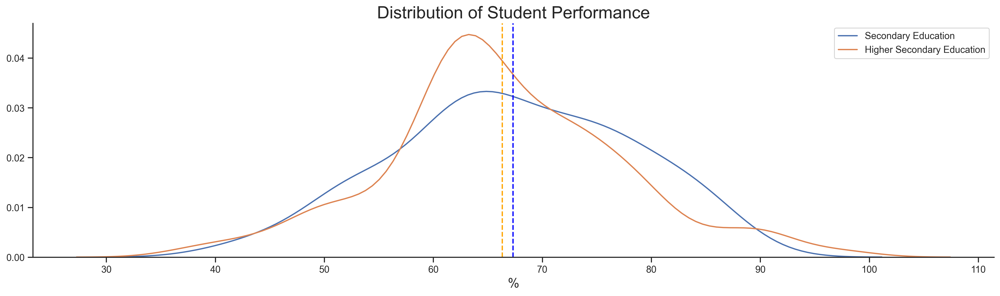

In [32]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(df['ssc_p'], label='Secondary Education', hist=False)
sns.distplot(df['hsc_p'], label='Higher Secondary Education', hist=False)
plt.title('Distribution of Student Performance', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('', fontsize = 15)
plt.axvline(df['ssc_p'].mean(), ls='--', c='blue')
plt.axvline(df['hsc_p'].mean(), ls='--', c='orange')
sns.despine(top=True);

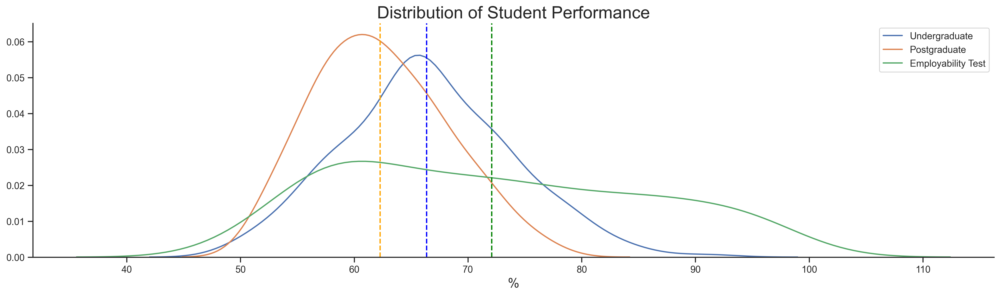

In [33]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(df['degree_p'], label='Undergraduate', hist=False)
sns.distplot(df['mba_p'], label='Postgraduate', hist=False)
sns.distplot(df['etest_p'], label='Employability Test', hist=False)
plt.title('Distribution of Student Performance', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('', fontsize = 15)
plt.axvline(df['degree_p'].mean(), ls='--', c='blue')
plt.axvline(df['mba_p'].mean(), ls='--', c='orange')
plt.axvline(df['etest_p'].mean(), ls='--', c='green')
sns.despine(top=True);

In [26]:
male_filter = df[df['gender']=='M']
female_filter = df[df['gender']=='F']
workex_filter = df[df['workex']==1]
workex_no_filter = df[df['workex']!=1]
degree_comm_filter = df[df['degree_t']=='Comm&Mgmt']
degree_sci_filter = df[df['degree_t']=='Sci&Tech']
degree_other_filter = df[df['degree_t']=='Others']
placed_filter = df[df['placed']==1]
placed_not_filter = df[df['placed']!=1]
mba_hr_filter = df[df['specialisation']=='Mkt&HR']
mba_fin_filter = df[df['specialisation']=='Mkt&Fin']

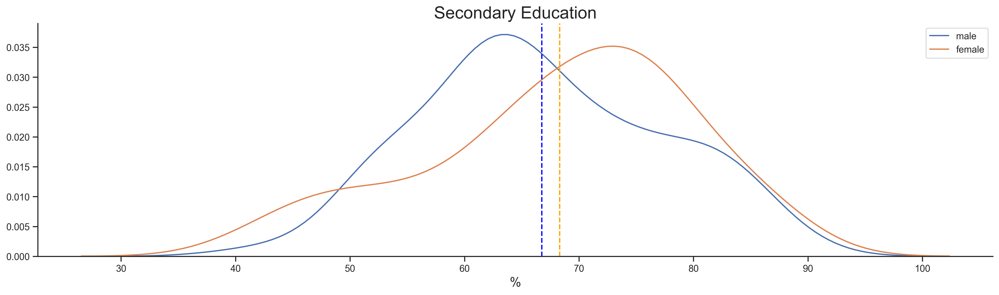

In [42]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter['ssc_p'], label='male', hist=False)
sns.distplot(female_filter['ssc_p'], label='female', hist=False)
plt.title('Secondary Education', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('', fontsize = 15)
sns.despine(top=True)
plt.axvline(male_filter['ssc_p'].mean(), ls='--', c='blue')
plt.axvline(female_filter['ssc_p'].mean(), ls='--', c='orange')
plt.legend();

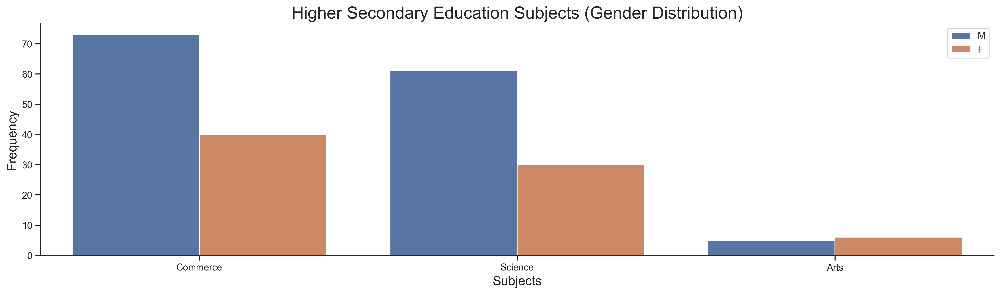

In [7]:
plt.figure(figsize=(20, 5), dpi=300)

sns.countplot(df['hsc_s'],
              data=df,
              hue='gender')
plt.title('Higher Secondary Education Subjects (Gender Distribution)', fontsize = 20)
plt.xlabel('Subjects', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

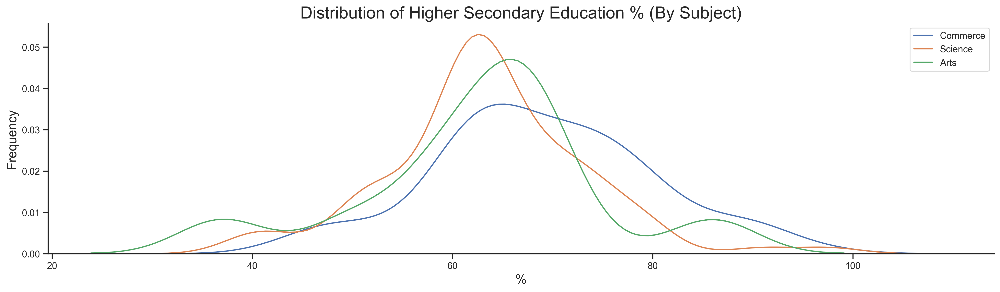

In [8]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(df[df['hsc_s']=='Commerce']['hsc_p'], label='Commerce', hist=False)
sns.distplot(df[df['hsc_s']=='Science']['hsc_p'], label='Science', hist=False)
sns.distplot(df[df['hsc_s']=='Arts']['hsc_p'], label='Arts', hist=False)
plt.title('Distribution of Higher Secondary Education % (By Subject)', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

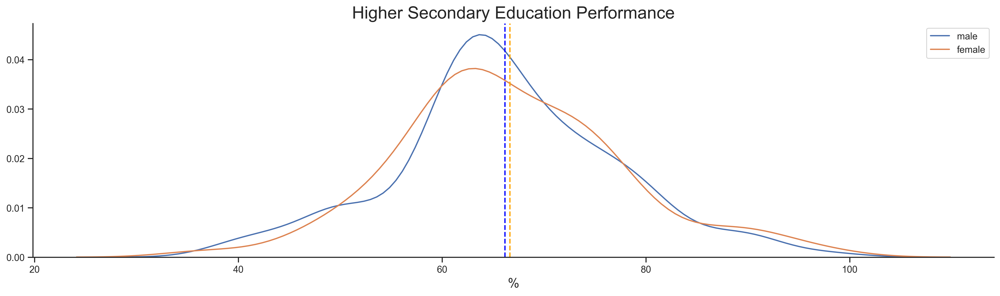

In [41]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter['hsc_p'], label='male', hist=False)
sns.distplot(female_filter['hsc_p'], label='female', hist=False)
plt.title('Higher Secondary Education Performance', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('', fontsize = 15)
sns.despine(top=True)
plt.axvline(male_filter['hsc_p'].mean(), ls='--', c='blue')
plt.axvline(female_filter['hsc_p'].mean(), ls='--', c='orange')
plt.legend();

<ipython-input-10-38f122da58f4>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(male_filter[df['hsc_s']=='Commerce']['hsc_p'], label='Male', hist=False)
<ipython-input-10-38f122da58f4>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(female_filter[df['hsc_s']=='Commerce']['hsc_p'], label='Female', hist=False)


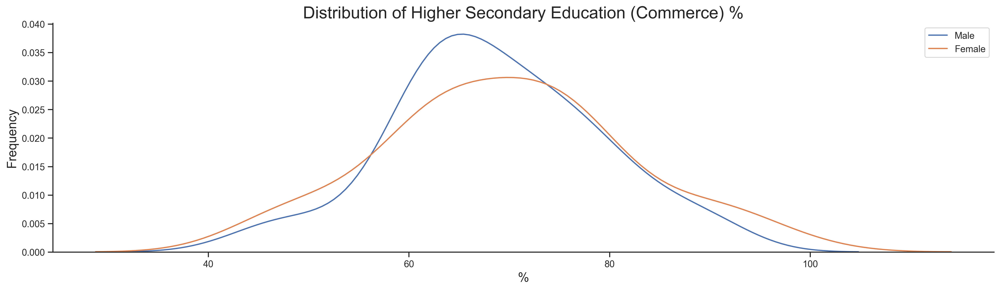

In [10]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter[df['hsc_s']=='Commerce']['hsc_p'], label='Male', hist=False)
sns.distplot(female_filter[df['hsc_s']=='Commerce']['hsc_p'], label='Female', hist=False)
plt.title('Distribution of Higher Secondary Education (Commerce) %', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

<ipython-input-11-921a3bd1e970>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(male_filter[df['hsc_s']=='Science']['hsc_p'], label='Male', hist=False)
<ipython-input-11-921a3bd1e970>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(female_filter[df['hsc_s']=='Science']['hsc_p'], label='Female', hist=False)


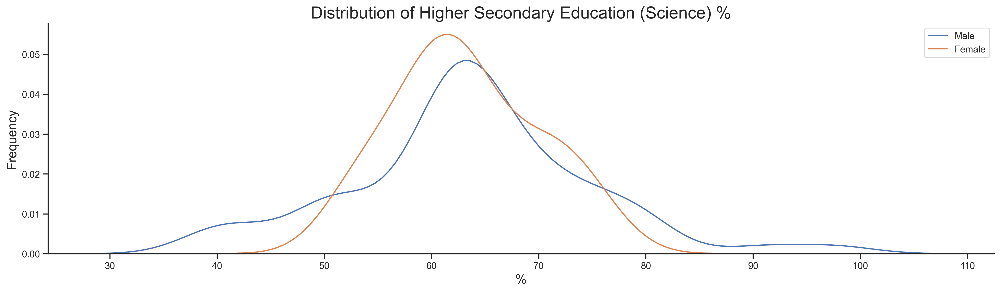

In [11]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter[df['hsc_s']=='Science']['hsc_p'], label='Male', hist=False)
sns.distplot(female_filter[df['hsc_s']=='Science']['hsc_p'], label='Female', hist=False)
plt.title('Distribution of Higher Secondary Education (Science) %', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

<ipython-input-12-a4ef17fd8d86>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(male_filter[df['hsc_s']=='Arts']['hsc_p'], label='Male', hist=False)
<ipython-input-12-a4ef17fd8d86>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(female_filter[df['hsc_s']=='Arts']['hsc_p'], label='Female', hist=False)


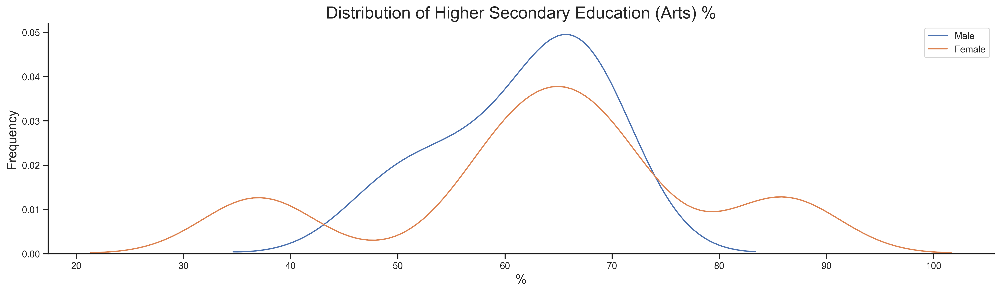

In [12]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter[df['hsc_s']=='Arts']['hsc_p'], label='Male', hist=False)
sns.distplot(female_filter[df['hsc_s']=='Arts']['hsc_p'], label='Female', hist=False)
plt.title('Distribution of Higher Secondary Education (Arts) %', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

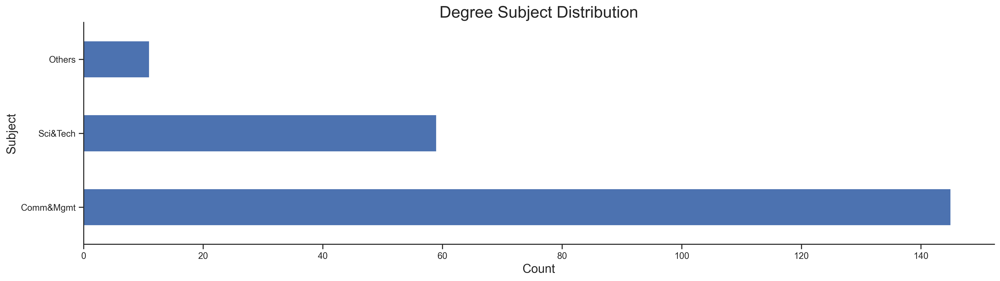

In [13]:
plt.figure(figsize=(20, 5), dpi=300)

df['degree_t'].value_counts().plot(kind='barh')
plt.title('Degree Subject Distribution', fontsize = 20)
plt.xlabel('Count', fontsize = 15)
plt.ylabel('Subject', fontsize = 15)
sns.despine(top=True);

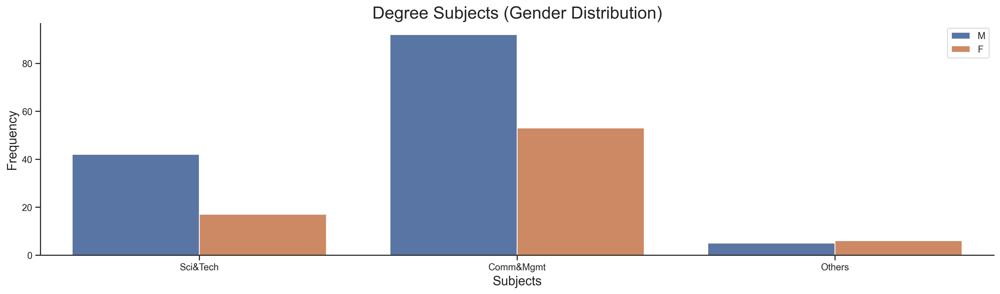

In [14]:
plt.figure(figsize=(20, 5), dpi=300)

sns.countplot(df['degree_t'],
              data=df,
              hue='gender')
plt.title('Degree Subjects (Gender Distribution)', fontsize = 20)
plt.xlabel('Subjects', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

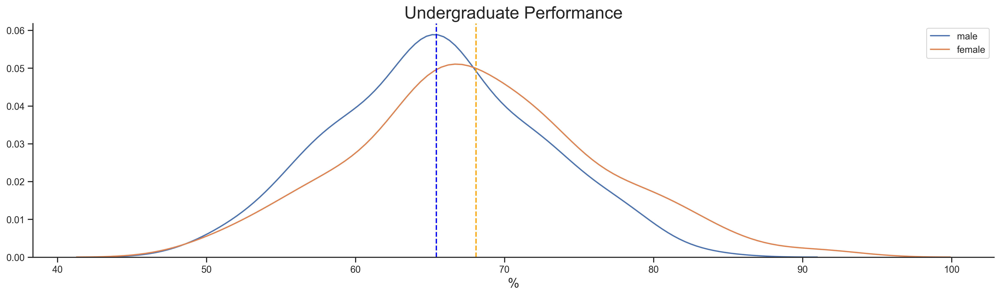

In [40]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter['degree_p'], label='male', hist=False)
sns.distplot(female_filter['degree_p'], label='female', hist=False)
plt.title('Undergraduate Performance', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('', fontsize = 15)
sns.despine(top=True)
plt.axvline(male_filter['degree_p'].mean(), ls='--', c='blue')
plt.axvline(female_filter['degree_p'].mean(), ls='--', c='orange')
plt.legend();

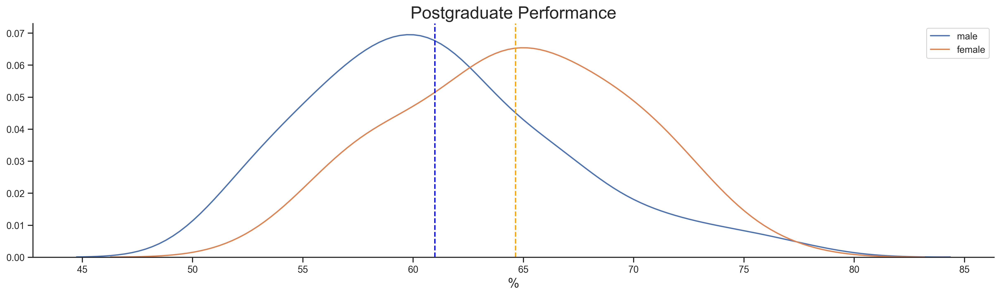

In [39]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter['mba_p'], label='male', hist=False)
sns.distplot(female_filter['mba_p'], label='female', hist=False)
plt.title('Postgraduate Performance', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('', fontsize = 15)
sns.despine(top=True)
plt.axvline(male_filter['mba_p'].mean(), ls='--', c='blue')
plt.axvline(female_filter['mba_p'].mean(), ls='--', c='orange')
plt.legend();

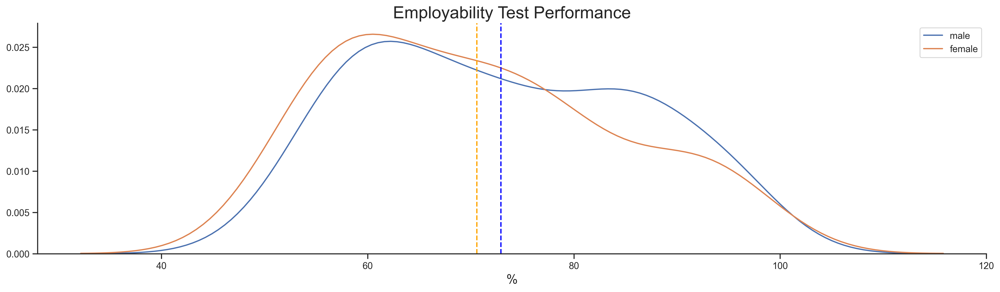

In [43]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter['etest_p'], label='male', hist=False)
sns.distplot(female_filter['etest_p'], label='female', hist=False)
plt.title('Employability Test Performance', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('', fontsize = 15)
sns.despine(top=True)
plt.axvline(male_filter['etest_p'].mean(), ls='--', c='blue')
plt.axvline(female_filter['etest_p'].mean(), ls='--', c='orange')
plt.legend();

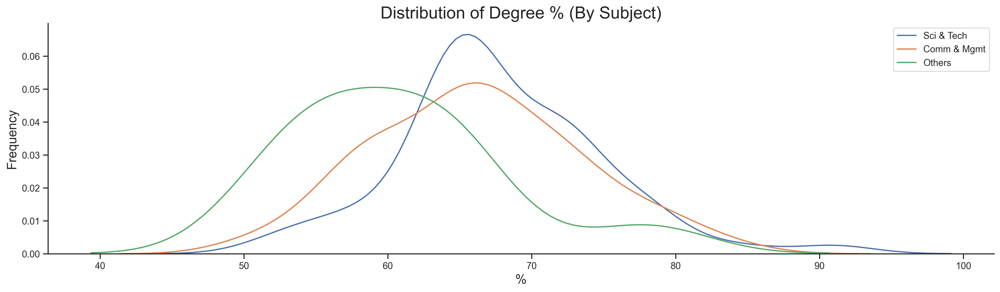

In [16]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(df[df['degree_t']=='Sci&Tech']['degree_p'], label='Sci & Tech', hist=False)
sns.distplot(df[df['degree_t']=='Comm&Mgmt']['degree_p'], label='Comm & Mgmt', hist=False)
sns.distplot(df[df['degree_t']=='Others']['degree_p'], label='Others', hist=False)
plt.title('Distribution of Degree % (By Subject)', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

<ipython-input-17-14fa0f025291>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(male_filter[df['degree_t']=='Sci&Tech']['degree_p'], label='Male', hist=False)
<ipython-input-17-14fa0f025291>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(female_filter[df['degree_t']=='Sci&Tech']['degree_p'], label='Female', hist=False)


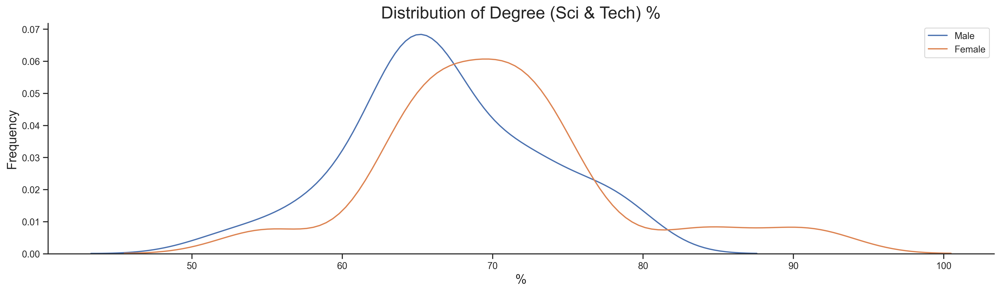

In [17]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter[df['degree_t']=='Sci&Tech']['degree_p'], label='Male', hist=False)
sns.distplot(female_filter[df['degree_t']=='Sci&Tech']['degree_p'], label='Female', hist=False)
plt.title('Distribution of Degree (Sci & Tech) %', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

<ipython-input-18-0c28d13758c8>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(male_filter[df['degree_t']=='Comm&Mgmt']['degree_p'], label='Male', hist=False)
<ipython-input-18-0c28d13758c8>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(female_filter[df['degree_t']=='Comm&Mgmt']['degree_p'], label='Female', hist=False)


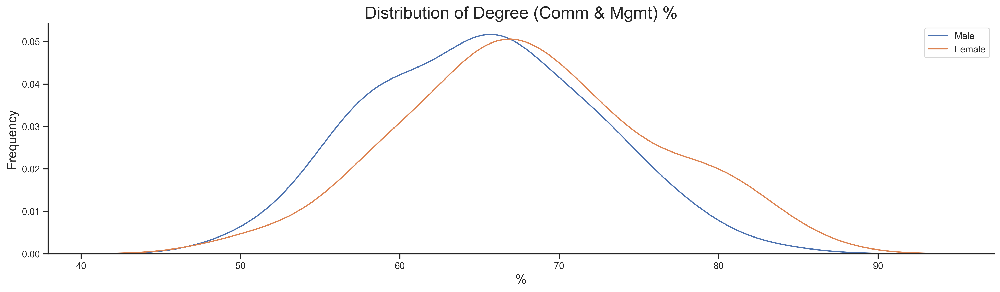

In [18]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter[df['degree_t']=='Comm&Mgmt']['degree_p'], label='Male', hist=False)
sns.distplot(female_filter[df['degree_t']=='Comm&Mgmt']['degree_p'], label='Female', hist=False)
plt.title('Distribution of Degree (Comm & Mgmt) %', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

<ipython-input-19-ec25b5483f1e>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(male_filter[df['degree_t']=='Others']['degree_p'], label='Male', hist=False)
<ipython-input-19-ec25b5483f1e>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(female_filter[df['degree_t']=='Others']['degree_p'], label='Female', hist=False)


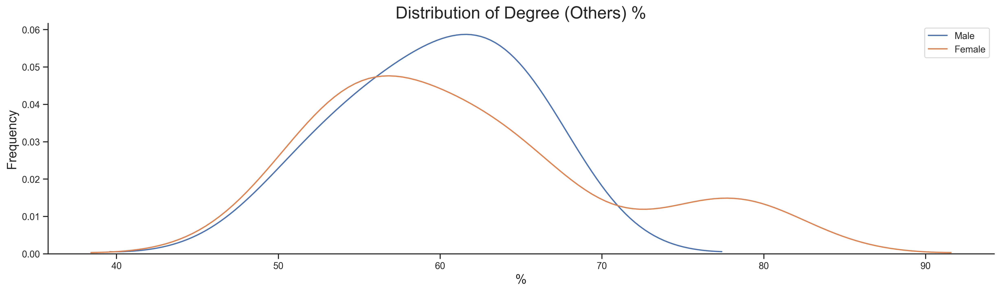

In [19]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter[df['degree_t']=='Others']['degree_p'], label='Male', hist=False)
sns.distplot(female_filter[df['degree_t']=='Others']['degree_p'], label='Female', hist=False)
plt.title('Distribution of Degree (Others) %', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

In [47]:
print('************************')
print('Work Experience Analysis')
print('************************\n')
print('{:.2%} of the total students have work experience\n'.format(df['workex'].sum()/len(df)))
print('{:.2%} of male students have work experience'.format(male_filter['workex'].sum()/len(male_filter)))
print('{:.2%} of female students have work experience\n'.format(female_filter['workex'].sum()/len(female_filter)))
print('{:.2%} of Comm & Mgmt students have work experience'.format(degree_comm_filter['workex'].sum()/len(degree_comm_filter)))
print('{:.2%} of Sci & Tech students have work experience'.format(degree_sci_filter['workex'].sum()/len(degree_sci_filter)))
print('{:.2%} of Others students have work experience\n'.format(degree_other_filter['workex'].sum()/len(degree_other_filter)))
print('{:.2%} of students with work experience were placed'.format(workex_filter['placed'].sum()/len(workex_filter)))
print('{:.2%} of students without work experience were placed\n'.format(workex_no_filter['placed'].sum()/len(workex_no_filter)))
print('The average Employability Test marks for students with work experience = {:.2f}%'.format(workex_filter['etest_p'].mean()))
print('The average Employability Test marks for students without work experience = {:.2f}%'.format(workex_no_filter['etest_p'].mean()))

************************
Work Experience Analysis
************************

34.42% of the total students have work experience

37.41% of male students have work experience
28.95% of female students have work experience

31.03% of Comm & Mgmt students have work experience
42.37% of Sci & Tech students have work experience
36.36% of Others students have work experience

86.49% of students with work experience were placed
59.57% of students without work experience were placed

The average Employability Test marks for students with work experience = 73.14%
The average Employability Test marks for students without work experience = 71.56%


In [48]:
print('******************')
print('Placement Analysis')
print('******************\n')

print('{:.2%} of the total students were placed\n'.format(df['placed'].sum()/len(df)))
print('{:.2%} of male students were placed'.format(male_filter['placed'].sum()/len(male_filter)))
print('{:.2%} of female students were placed\n'.format(female_filter['placed'].sum()/len(female_filter)))
print('{:.2%} of Comm & Mgmt students were placed'.format(degree_comm_filter['placed'].sum()/len(degree_comm_filter)))
print('{:.2%} of Sci & Tech students were placed'.format(degree_sci_filter['placed'].sum()/len(degree_sci_filter)))
print('{:.2%} of Others students were placed\n'.format(degree_other_filter['placed'].sum()/len(degree_other_filter)))
print('{:.2%} of students with work experience were placed'.format(workex_filter['placed'].sum()/len(workex_filter)))
print('{:.2%} of students without work experience were placed\n'.format(workex_no_filter['placed'].sum()/len(workex_no_filter)))
print('The average Employability Test marks for placed students = {:.2f}%'.format(placed_filter['etest_p'].mean()))
print('The average Employability Test marks for not placed students = {:.2f}%'.format(placed_not_filter['etest_p'].mean()))

******************
Placement Analysis
******************

68.84% of the total students were placed

71.94% of male students were placed
63.16% of female students were placed

70.34% of Comm & Mgmt students were placed
69.49% of Sci & Tech students were placed
45.45% of Others students were placed

86.49% of students with work experience were placed
59.57% of students without work experience were placed

The average Employability Test marks for placed students = 73.24%
The average Employability Test marks for not placed students = 69.59%


In [49]:
print('***************')
print('Salary Analysis')
print('***************\n')

print('The average salary offered is {:,.2f}\n'.format(placed_filter['salary'].mean()))

print('The average salary offered to male students is {:,.2f}'.format(male_filter['salary'].mean()))
print('The average salary offered to female students is {:,.2f}\n'.format(female_filter['salary'].mean()))
print('The average salary offered to Comm & Mgmt students is {:,.2f}'.format(degree_comm_filter['salary'].mean()))
print('The average salary offered to Sci & Tech students is {:,.2f}'.format(degree_sci_filter['salary'].mean()))
print('The average salary offered to Others students is {:,.2f}\n'.format(degree_other_filter['salary'].mean()))

print('The average salary offered to Mkt & HR (MBA) students is {:,.2f}'.format(mba_hr_filter['salary'].mean()))
print('The average salary offered to Mkt & Fin (MBA) students is {:,.2f}\n'.format(mba_fin_filter['salary'].mean()))


print('The average salary offered to students with work experience {:,.2f}'.format(workex_filter['salary'].mean()))
print('The average salary offered to students without work experience {:,.2f}'.format(workex_no_filter['salary'].mean()))

***************
Salary Analysis
***************

The average salary offered is 288,655.41

The average salary offered to male students is 298,910.00
The average salary offered to female students is 267,291.67

The average salary offered to Comm & Mgmt students is 278,627.45
The average salary offered to Sci & Tech students is 314,609.76
The average salary offered to Others students is 280,400.00

The average salary offered to Mkt & HR (MBA) students is 270,377.36
The average salary offered to Mkt & Fin (MBA) students is 298,852.63

The average salary offered to students with work experience 303,265.62
The average salary offered to students without work experience 277,523.81


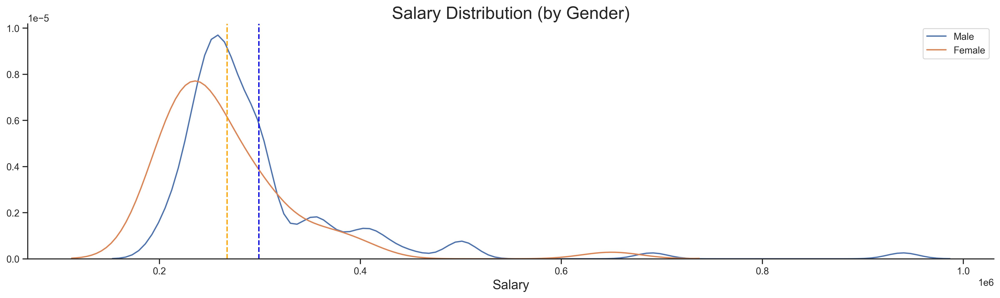

In [50]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter['salary'], label='Male', hist=False)
sns.distplot(female_filter['salary'], label='Female', hist=False)
plt.title('Salary Distribution (by Gender)', fontsize = 20)
plt.xlabel('Salary', fontsize = 15)
sns.despine(top=True)
plt.legend()
plt.axvline(male_filter['salary'].mean(), ls='--', c='blue')
plt.axvline(female_filter['salary'].mean(), ls='--', c='orange');

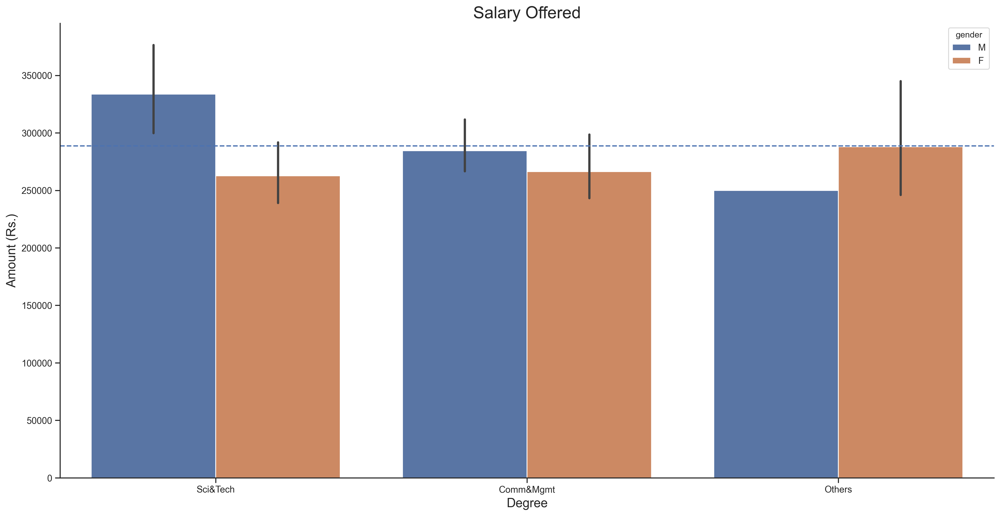

In [24]:
plt.figure(figsize=(20, 10), dpi=300)

sns.barplot(data=df,
           x='degree_t',
           y='salary',
           hue='gender')
plt.xlabel('Degree', fontsize = 15)
plt.ylabel('Amount (Rs.)', fontsize = 15)
plt.title('Salary Offered', fontsize = 20)
sns.despine(top=True)
plt.axhline(placed_filter['salary'].mean(), ls='--');

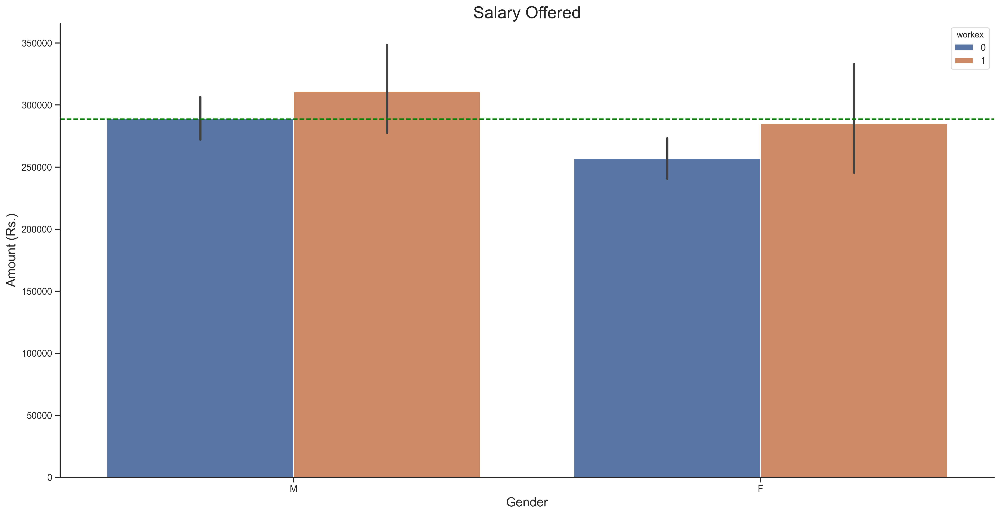

In [51]:
plt.figure(figsize=(20, 10), dpi=300)

sns.barplot(data=df,
           x='gender',
           y='salary',
           hue='workex')
plt.xlabel('Gender', fontsize = 15)
plt.ylabel('Amount (Rs.)', fontsize = 15)
plt.title('Salary Offered', fontsize = 20)
sns.despine(top=True)
plt.axhline(placed_filter['salary'].mean(), ls='--', c='green');

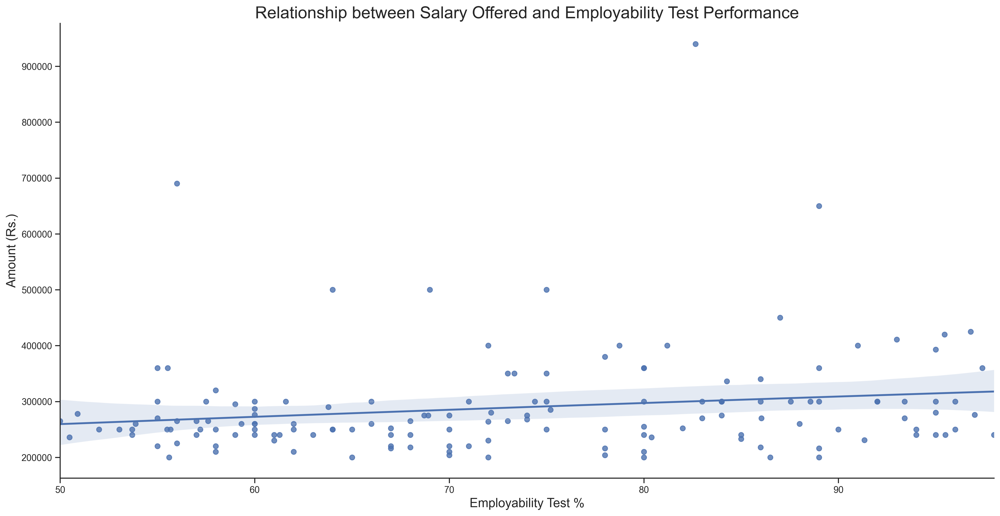

In [62]:
plt.figure(figsize=(20, 10), dpi=300)

sns.regplot(data=df,
               x='etest_p',
               y='salary', order=2)
plt.xlabel('Employability Test %', fontsize = 15)
plt.ylabel('Amount (Rs.)', fontsize = 15)
plt.title('Relationship between Salary Offered and Employability Test Performance', fontsize = 20)
sns.despine(top=True);

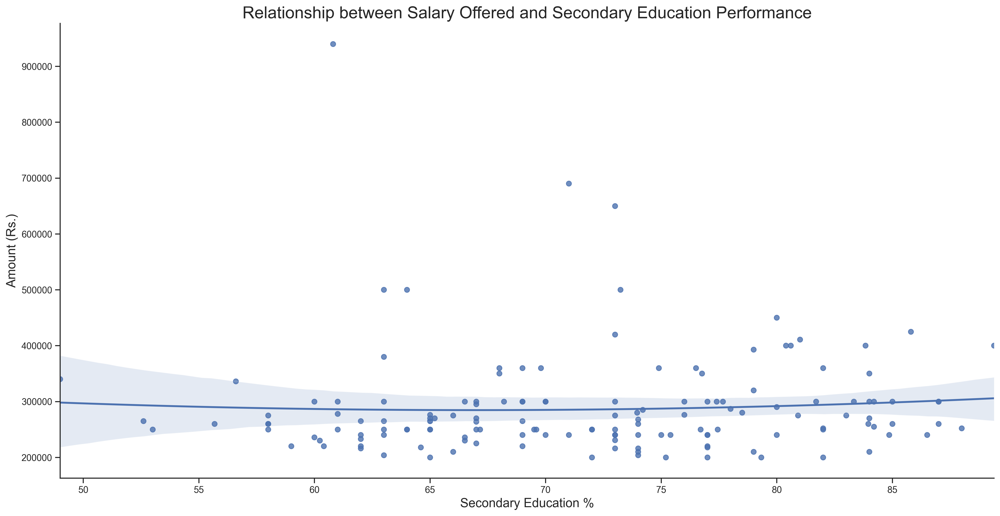

In [63]:
plt.figure(figsize=(20, 10), dpi=300)

sns.regplot(data=df,
               x='ssc_p',
               y='salary', order=2)
plt.xlabel('Secondary Education %', fontsize = 15)
plt.ylabel('Amount (Rs.)', fontsize = 15)
plt.title('Relationship between Salary Offered and Secondary Education Performance', fontsize = 20)
sns.despine(top=True);

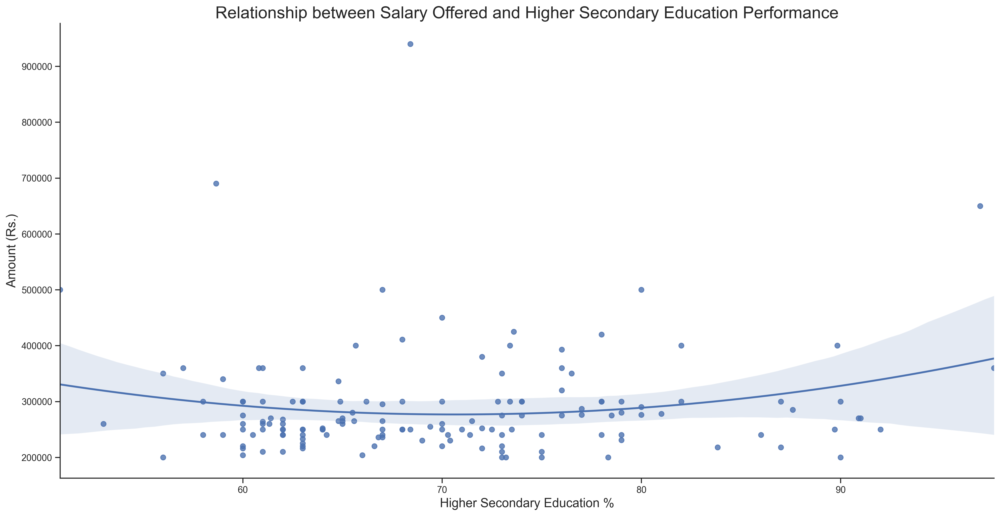

In [64]:
plt.figure(figsize=(20, 10), dpi=300)

sns.regplot(data=df,
               x='hsc_p',
               y='salary', order=2)
plt.xlabel('Higher Secondary Education %', fontsize = 15)
plt.ylabel('Amount (Rs.)', fontsize = 15)
plt.title('Relationship between Salary Offered and Higher Secondary Education Performance', fontsize = 20)
sns.despine(top=True);

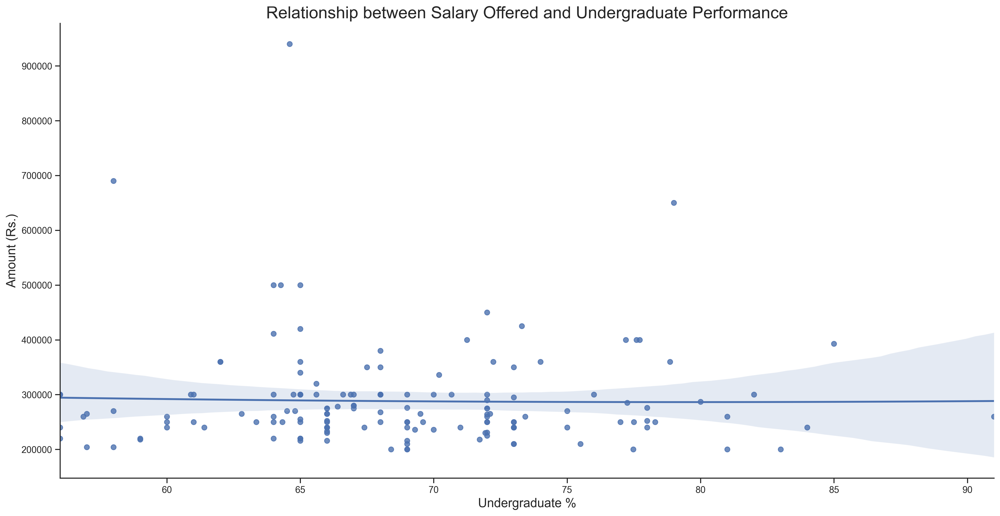

In [67]:
plt.figure(figsize=(20, 10), dpi=300)

sns.regplot(data=df,
               x='degree_p',
               y='salary', order=2)
plt.xlabel('Undergraduate %', fontsize = 15)
plt.ylabel('Amount (Rs.)', fontsize = 15)
plt.title('Relationship between Salary Offered and Undergraduate Performance', fontsize = 20)
sns.despine(top=True);

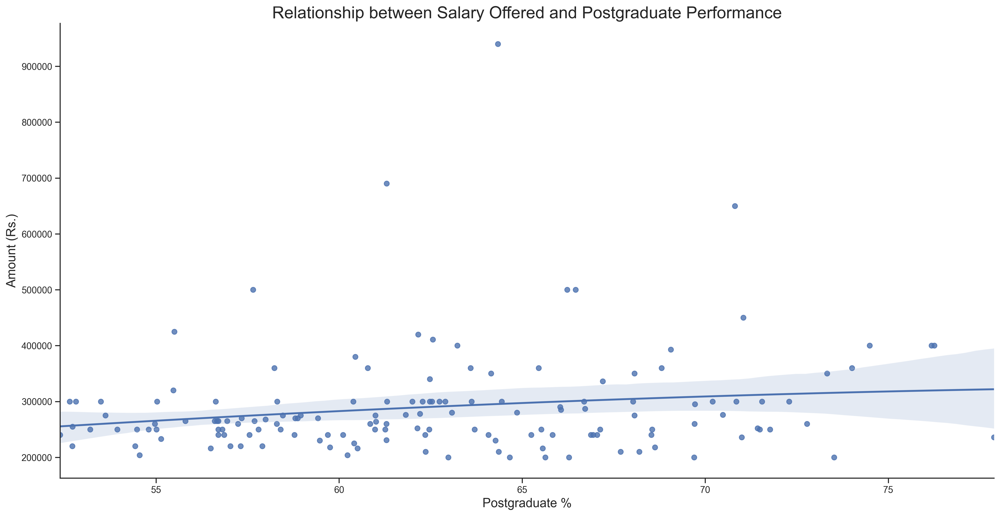

In [68]:
plt.figure(figsize=(20, 10), dpi=300)

sns.regplot(data=df,
               x='mba_p',
               y='salary', order=2)
plt.xlabel('Postgraduate %', fontsize = 15)
plt.ylabel('Amount (Rs.)', fontsize = 15)
plt.title('Relationship between Salary Offered and Postgraduate Performance', fontsize = 20)
sns.despine(top=True);

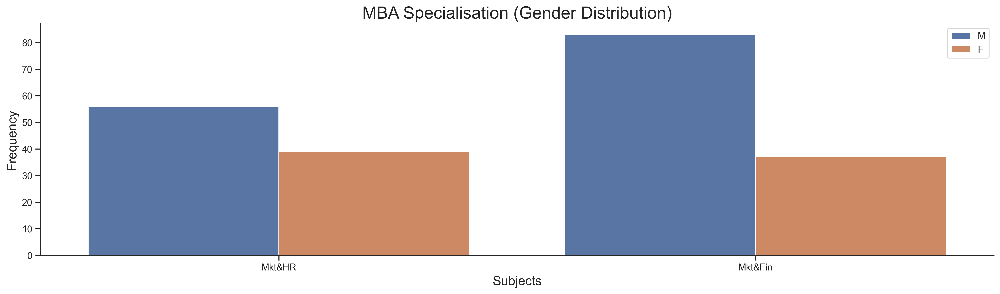

In [32]:
plt.figure(figsize=(20, 5), dpi=300)

sns.countplot(df['specialisation'],
              data=df,
              hue='gender')
plt.title('MBA Specialisation (Gender Distribution)', fontsize = 20)
plt.xlabel('Subjects', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

<ipython-input-34-2ea8e66ac5d5>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(male_filter[df['specialisation']=='Mkt&HR']['mba_p'], label='Male', hist=False)
<ipython-input-34-2ea8e66ac5d5>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(female_filter[df['specialisation']=='Mkt&HR']['mba_p'], label='Female', hist=False)


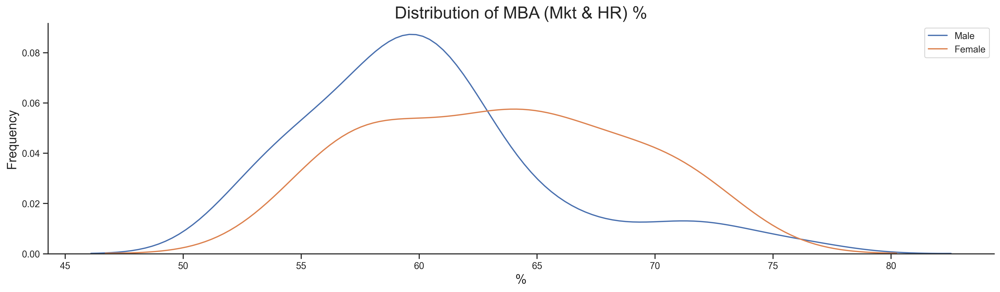

In [34]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter[df['specialisation']=='Mkt&HR']['mba_p'], label='Male', hist=False)
sns.distplot(female_filter[df['specialisation']=='Mkt&HR']['mba_p'], label='Female', hist=False)
plt.title('Distribution of MBA (Mkt & HR) %', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

<ipython-input-35-3fc52a2ec98c>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(male_filter[df['specialisation']=='Mkt&Fin']['mba_p'], label='Male', hist=False)
<ipython-input-35-3fc52a2ec98c>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.distplot(female_filter[df['specialisation']=='Mkt&Fin']['mba_p'], label='Female', hist=False)


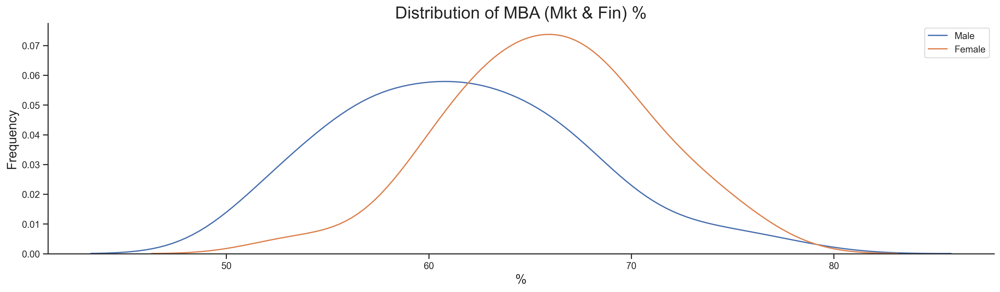

In [35]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(male_filter[df['specialisation']=='Mkt&Fin']['mba_p'], label='Male', hist=False)
sns.distplot(female_filter[df['specialisation']=='Mkt&Fin']['mba_p'], label='Female', hist=False)
plt.title('Distribution of MBA (Mkt & Fin) %', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
sns.despine(top=True)
plt.legend();

In [36]:
df.head()

,gender,ssc_p,ssc_b,hsc_p,hsc_b,hsc_s,degree_p,degree_t,workex,etest_p,specialisation,mba_p,placed,salary
0,M,67.00,Others,91.00,Others,Commerce,58.00,Sci&Tech,0,55.0,Mkt&HR,58.80,1,270000.0
1,M,79.33,Central,78.33,Others,Science,77.48,Sci&Tech,1,86.5,Mkt&Fin,66.28,1,200000.0
2,M,65.00,Central,68.00,Central,Arts,64.00,Comm&Mgmt,0,75.0,Mkt&Fin,57.80,1,250000.0
3,M,56.00,Central,52.00,Central,Science,52.00,Sci&Tech,0,66.0,Mkt&HR,59.43,0,NaN
4,M,85.80,Central,73.60,Central,Commerce,73.30,Comm&Mgmt,0,96.8,Mkt&Fin,55.50,1,425000.0


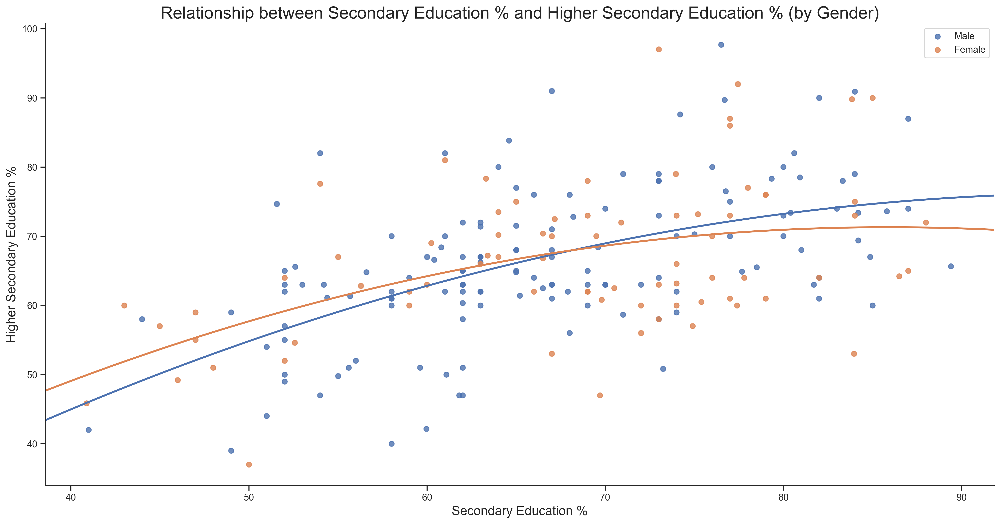

In [37]:
plt.figure(figsize=(20, 10), dpi=300)

sns.regplot(data=male_filter,
               x='ssc_p',
               y='hsc_p', label='Male', ci=None, truncate=False, order=2)
sns.regplot(data=female_filter,
               x='ssc_p',
               y='hsc_p', label='Female', ci=None, truncate=False, order=2)
plt.xlabel('Secondary Education %', fontsize = 15)
plt.ylabel('Higher Secondary Education %', fontsize = 15)
plt.title('Relationship between Secondary Education % and Higher Secondary Education % (by Gender)', fontsize = 20)
sns.despine(top=True)
plt.legend();

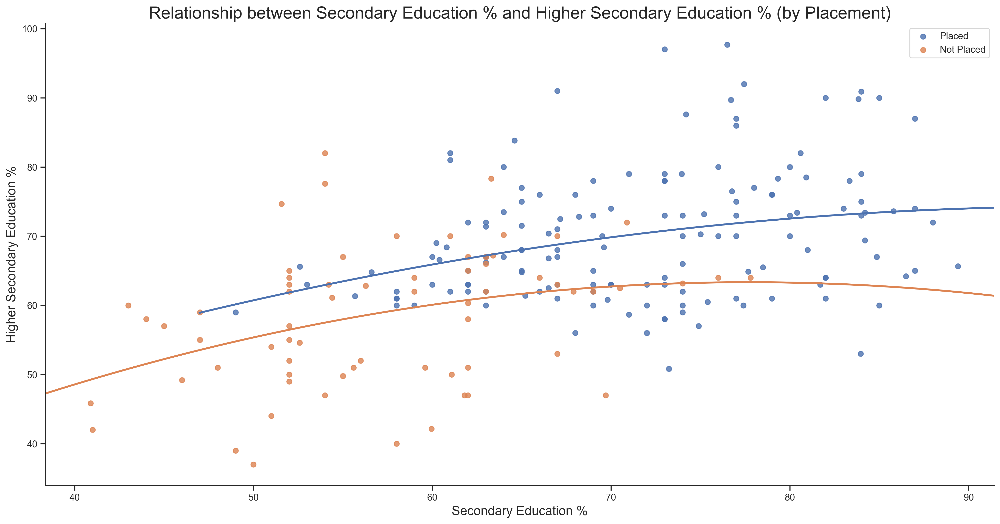

In [40]:
plt.figure(figsize=(20, 10), dpi=300)

sns.regplot(data=placed_filter,
               x='ssc_p',
               y='hsc_p', label='Placed', ci=None, truncate=False, order=2)
sns.regplot(data=placed_not_filter,
               x='ssc_p',
               y='hsc_p', label='Not Placed', ci=None, truncate=False, order=2)
plt.xlabel('Secondary Education %', fontsize = 15)
plt.ylabel('Higher Secondary Education %', fontsize = 15)
plt.title('Relationship between Secondary Education % and Higher Secondary Education % (by Placement)', fontsize = 20)
sns.despine(top=True)
plt.legend();

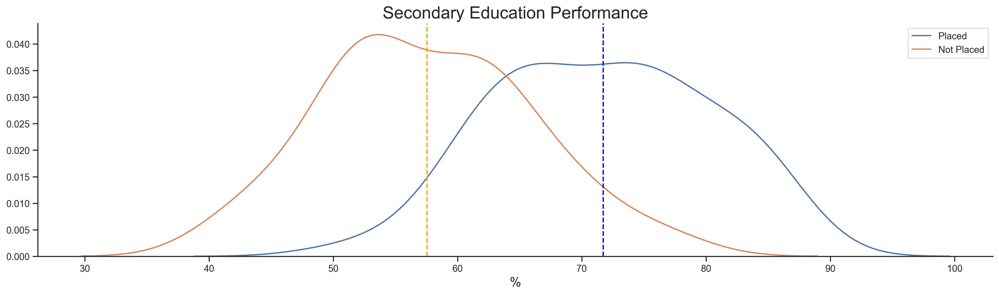

In [72]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(placed_filter['ssc_p'], label='Placed', hist=False)
sns.distplot(placed_not_filter['ssc_p'], label='Not Placed', hist=False)
plt.title('Secondary Education Performance', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('', fontsize = 15)
sns.despine(top=True)
plt.axvline(placed_filter['ssc_p'].mean(), ls='--', c='blue')
plt.axvline(placed_not_filter['ssc_p'].mean(), ls='--', c='orange')

plt.legend();

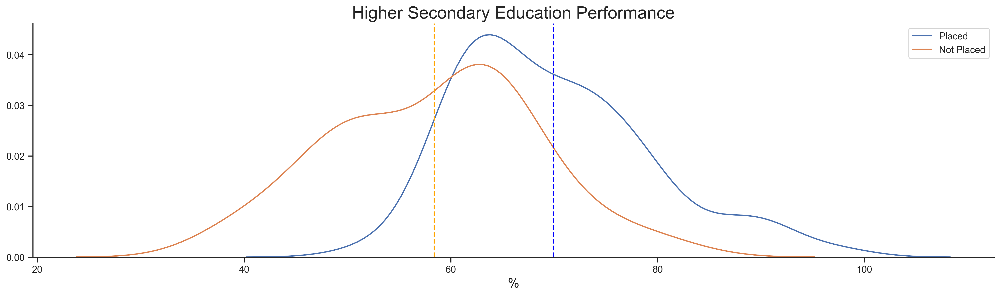

In [73]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(placed_filter['hsc_p'], label='Placed', hist=False)
sns.distplot(placed_not_filter['hsc_p'], label='Not Placed', hist=False)
plt.title('Higher Secondary Education Performance', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('', fontsize = 15)
sns.despine(top=True)
plt.axvline(placed_filter['hsc_p'].mean(), ls='--', c='blue')
plt.axvline(placed_not_filter['hsc_p'].mean(), ls='--', c='orange')
plt.legend();

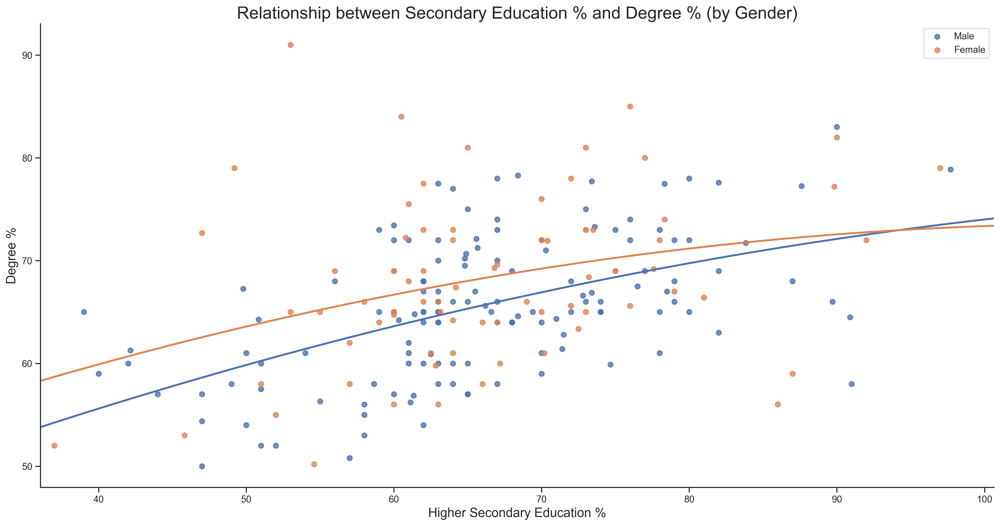

In [41]:
plt.figure(figsize=(20, 10), dpi=300)

sns.regplot(data=male_filter,
               x='hsc_p',
               y='degree_p', label='Male', ci=None, truncate=False, order=2)
sns.regplot(data=female_filter,
               x='hsc_p',
               y='degree_p', label='Female', ci=None, truncate=False, order=2)
plt.xlabel('Higher Secondary Education %', fontsize = 15)
plt.ylabel('Degree %', fontsize = 15)
plt.title('Relationship between Secondary Education % and Degree % (by Gender)', fontsize = 20)
sns.despine(top=True)
plt.legend();

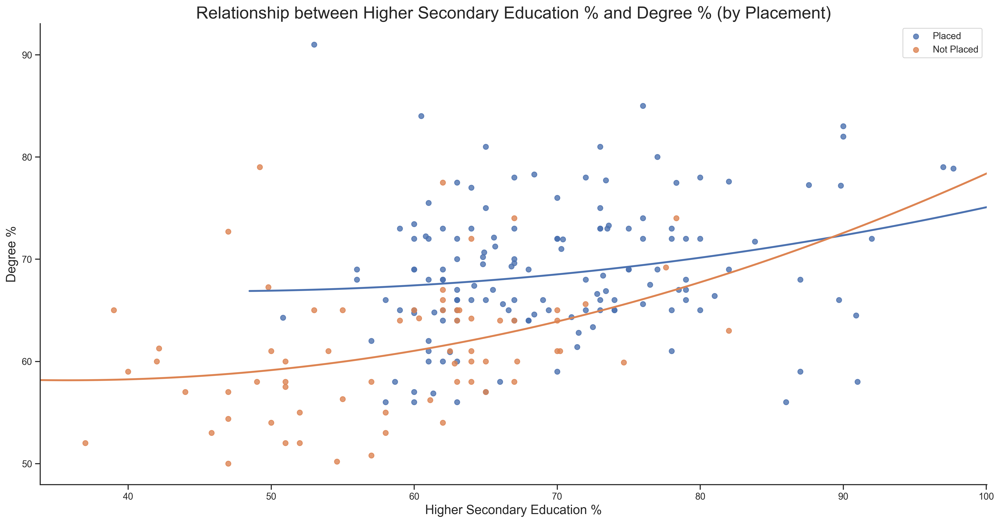

In [52]:
plt.figure(figsize=(20, 10), dpi=300)

sns.regplot(data=placed_filter,
               x='hsc_p',
               y='degree_p', label='Placed', ci=None, truncate=False, order=2)
sns.regplot(data=placed_not_filter,
               x='hsc_p',
               y='degree_p', label='Not Placed', ci=None, truncate=False, order=2)
plt.xlabel('Higher Secondary Education %', fontsize = 15)
plt.ylabel('Degree %', fontsize = 15)
plt.title('Relationship between Higher Secondary Education % and Degree % (by Placement)', fontsize = 20)
sns.despine(top=True)
plt.legend();

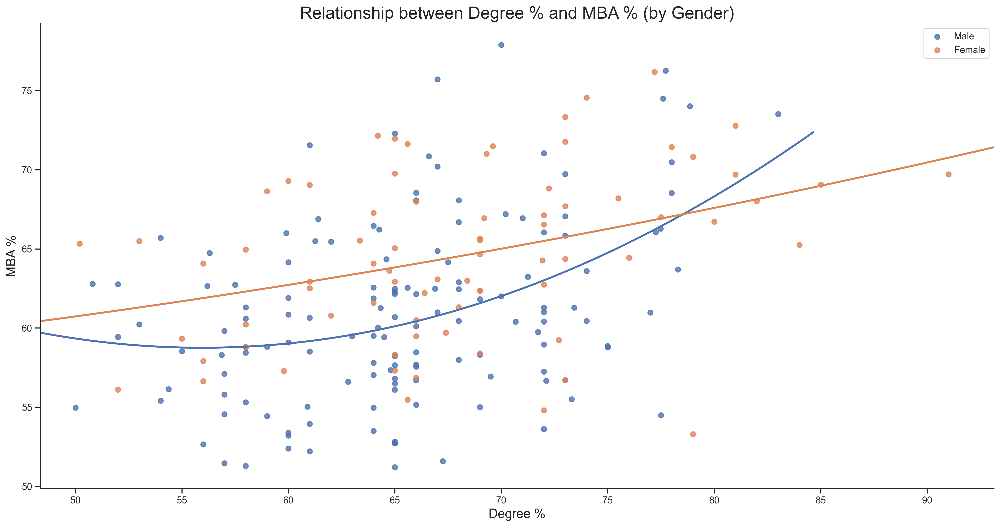

In [43]:
plt.figure(figsize=(20, 10), dpi=300)

sns.regplot(data=male_filter,
               x='degree_p',
               y='mba_p', label='Male', ci=None, truncate=False, order=2)
sns.regplot(data=female_filter,
               x='degree_p',
               y='mba_p', label='Female', ci=None, truncate=False, order=2)
plt.xlabel('Degree %', fontsize = 15)
plt.ylabel('MBA %', fontsize = 15)
plt.title('Relationship between Degree % and MBA % (by Gender)', fontsize = 20)
sns.despine(top=True)
plt.legend();

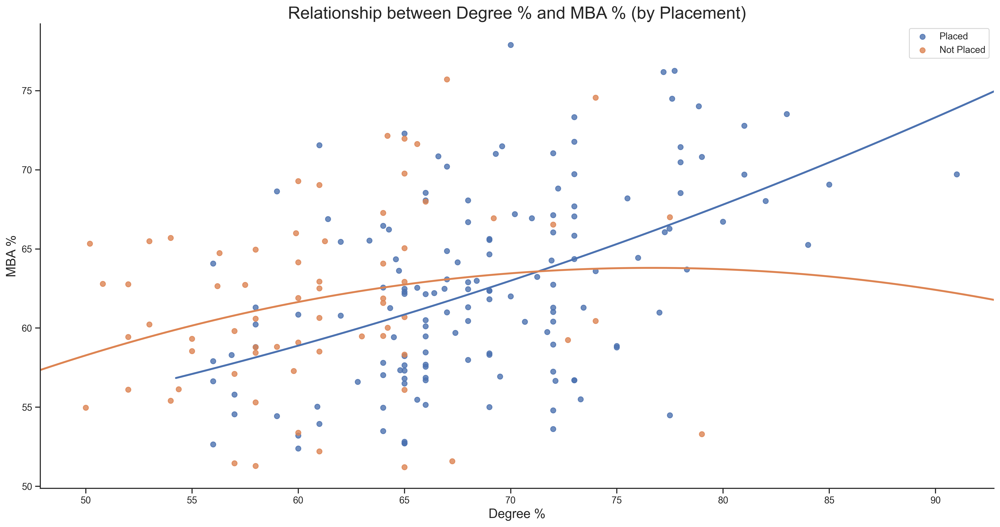

In [44]:
plt.figure(figsize=(20, 10), dpi=300)

sns.regplot(data=placed_filter,
               x='degree_p',
               y='mba_p', label='Placed', ci=None, truncate=False, order=2)
sns.regplot(data=placed_not_filter,
               x='degree_p',
               y='mba_p', label='Not Placed', ci=None, truncate=False, order=2)
plt.xlabel('Degree %', fontsize = 15)
plt.ylabel('MBA %', fontsize = 15)
plt.title('Relationship between Degree % and MBA % (by Placement)', fontsize = 20)
sns.despine(top=True)
plt.legend();

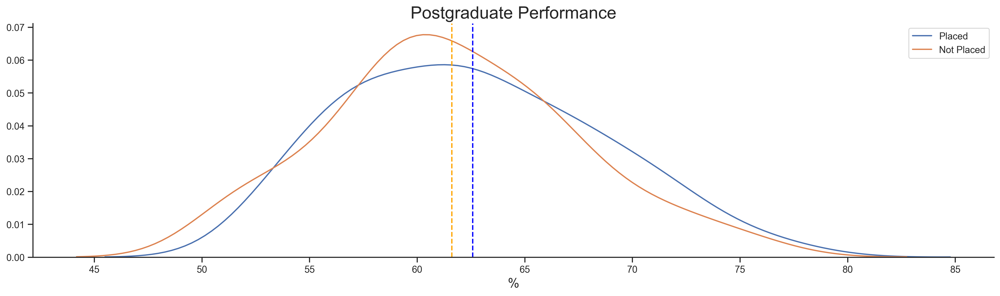

In [74]:
plt.figure(figsize=(20, 5), dpi=300)

sns.distplot(placed_filter['mba_p'], label='Placed', hist=False)
sns.distplot(placed_not_filter['mba_p'], label='Not Placed', hist=False)
plt.title('Postgraduate Performance', fontsize = 20)
plt.xlabel('%', fontsize = 15)
plt.ylabel('', fontsize = 15)
sns.despine(top=True)
plt.axvline(placed_filter['mba_p'].mean(), ls='--', c='blue')
plt.axvline(placed_not_filter['mba_p'].mean(), ls='--', c='orange')
plt.legend();

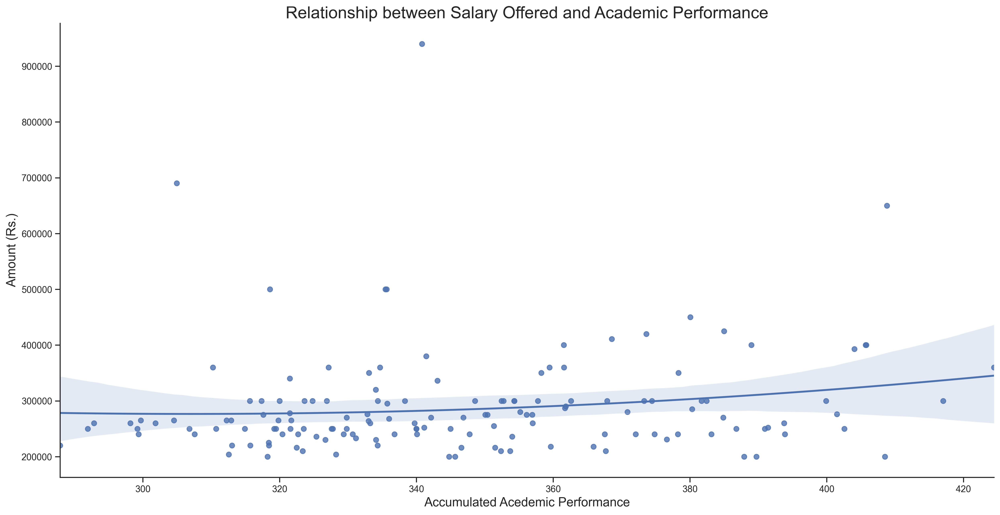

In [77]:
plt.figure(figsize=(20, 10), dpi=300)

total_marks = df['ssc_p'] + df['hsc_p'] + df['degree_p'] + df['mba_p'] + df['etest_p']

sns.regplot(data=df,
               x=total_marks,
               y='salary', order=2)
plt.xlabel('Accumulated Acedemic Performance', fontsize = 15)
plt.ylabel('Amount (Rs.)', fontsize = 15)
plt.title('Relationship between Salary Offered and Academic Performance', fontsize = 20)
sns.despine(top=True);